# ДЗ 2.2: Задача трёх тел (2D)

Цели:
- Реализовать численное решение классической задачи трёх тел методом RK4 в 2D.
- Построить графики модуля скорости.
- Исследовать влияние начальных условий и масс, сделать анимацию, найти устойчивую конфигурацию.

Ключевые параметры и модель:
- Вектор состояния: state = [x1, y1, x2, y2, x3, y3, vx1, vy1, vx2, vy2, vx3, vy3].
- Массы: m1, m2, m3. Гравитационная постоянная: G.
- Правые части (без столкновений и без внешних сил):
  • r'i = v_i
  • v'i = сумма по j!=i: G * m_j * (r_j - r_i) / |r_j - r_i|^3
- Энергия: E = K + U
  • K = 0.5 * sum_i m_i * |v_i|^2
  • U = - sum_{i<j} G * m_i * m_j / |r_i - r_j|

Численные схемы:
- RK4.

Визуализации:
- Траектории тел на плоскости.
- Модуль скорости по времени для каждого тела.
- Энергия/инварианты (по желанию) для контроля точности.
- Анимация движения.


In [1]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

G = 1.0


Определяем функции:
- `accelerations` — правые части: производные state с попарным гравитационным притяжением.
- `rhs` — правые части: производные state с попарным гравитационным притяжением.
- Интегрируем во времени и копим траектории для трёх тел.

In [2]:

def accelerations(r, m):
    a = np.zeros_like(r, dtype=float)
    for i in range(3):
        for j in range(3):
            if i == j:
                continue
            diff = r[j] - r[i]
            dist2 = diff[0]*diff[0] + diff[1]*diff[1]
            inv_r3 = 1.0 / (dist2 * np.sqrt(dist2))
            a[i] += G * m[j] * diff * inv_r3
    return a

def rhs(y, m):
    r = y[:6].reshape(3, 2)
    v = y[6:].reshape(3, 2)
    a = accelerations(r, m)
    dy = np.zeros_like(y)
    dy[:6] = v.reshape(-1)
    dy[6:] = a.reshape(-1)
    return dy


Определяем функции:
- `rk4_step` — один шаг схемы Рунге–Кутты 4-го порядка (k1..k4).
- `integrate_rk4` — один шаг схемы Рунге–Кутты 4-го порядка (k1..k4).
- Задаём параметры, начальные условия или собираем вектор состояния.
- Интегрируем во времени и копим траектории для трёх тел.

In [3]:

def rk4_step(y, h, m):
    k1 = rhs(y, m)
    k2 = rhs(y + 0.5*h*k1, m)
    k3 = rhs(y + 0.5*h*k2, m)
    k4 = rhs(y + h*k3, m)
    return y + (h/6.0)*(k1 + 2*k2 + 2*k3 + k4)

def integrate_rk4(y0, t0, t1, dt, m):
    n = int(np.ceil((t1 - t0)/dt))
    T = np.linspace(t0, t1, n+1)
    Y = np.zeros((n+1, y0.size), dtype=float)
    Y[0] = y0
    y = y0.copy()
    for k in range(n):
        y = rk4_step(y, dt, m)
        Y[k+1] = y
    return T, Y


### Блок 4: что и зачем

- Задаём параметры, начальные условия или собираем вектор состояния.

In [4]:

m = np.array([1.0, 1.0, 1.0])

r1 = np.array([-0.97000436,  0.24308753])
r2 = np.array([ 0.97000436, -0.24308753])
r3 = np.array([ 0.0      ,  0.0       ])

v1 = np.array([ 0.4662036850,  0.4323657300])
v2 = np.array([ 0.4662036850,  0.4323657300])
v3 = np.array([-0.93240737 , -0.86473146 ])

# r1 = np.array([-0.5, 0.0])
# r2 = np.array([ 0.5, 0.0])
# r3 = np.array([ 0.0, 2.0])

# v1 = np.array([ 0.0,  0.6])
# v2 = np.array([ 0.0, -0.6])
# v3 = np.array([ 1.0,  0.0])


# r1 = np.array([ 1.0, 0.0])
# r2 = np.array([-0.5, np.sqrt(3)/2])
# r3 = np.array([-0.5, -np.sqrt(3)/2])

# v1 = np.array([ 0.0,  0.5])
# v2 = np.array([ 0.5, -0.25])
# v3 = np.array([-0.5, -0.25])


# r1 = np.array([-1.0, 0.0])
# r2 = np.array([ 0.0, 0.0])
# r3 = np.array([ 1.0, 0.0])

# v1 = np.array([ 0.0,  0.3])
# v2 = np.array([ 0.0, -0.6])
# v3 = np.array([ 0.0,  0.3])


# r1 = np.array([ 1.0,  0.1])
# r2 = np.array([-1.0, -0.1])
# r3 = np.array([ 0.0,  0.0])

# v1 = np.array([ 0.0, -0.5])
# v2 = np.array([ 0.0,  0.5])
# v3 = np.array([ 0.7,  0.0])

y0 = np.hstack([r1, r2, r3, v1, v2, v3])

t0 = 0.0
t1 = 6.3
dt = 0.001


- `T, Y = integrate_rk4(y0, t0, t1, dt, m)`  
  Численно интегрируем задачу трёх тел методом Рунге–Кутты 4-го порядка.  
  Результат: `T` — массив времени, `Y` — матрица решений.

- `R = Y[:, :6].reshape(-1, 3, 2)`  
  Берём первые 6 компонент состояния (координаты) и формируем массив вида `(N, 3, 2)`:  
  • `N` — число временных шагов,  
  • `3` — число тел,  
  • `2` — компоненты x, y.

- `V = Y[:, 6:].reshape(-1, 3, 2)`  
  Аналогично для скоростей: массив `(N, 3, 2)`.

- `speed = np.linalg.norm(V, axis=2)`  
  Вычисляем модуль скорости каждого тела:  
  `speed` имеет форму `(N, 3)`, где каждый столбец — скорость одного тела во времени.

In [5]:

T, Y = integrate_rk4(y0, t0, t1, dt, m)

R = Y[:, :6].reshape(-1, 3, 2)
V = Y[:, 6:].reshape(-1, 3, 2)
speed = np.linalg.norm(V, axis=2)


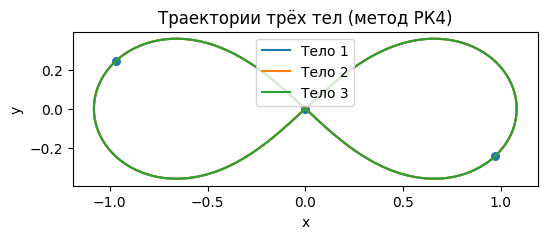

In [6]:
fig, ax = plt.subplots(figsize=(6,6))
ax.plot(R[:,0,0], R[:,0,1], label='Тело 1')
ax.plot(R[:,1,0], R[:,1,1], label='Тело 2')
ax.plot(R[:,2,0], R[:,2,1], label='Тело 3')
ax.scatter(R[0,:,0], R[0,:,1], s=30)  # начальные точки
ax.set_aspect('equal', 'box')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Траектории трёх тел (метод РК4)')
ax.legend()
plt.show()


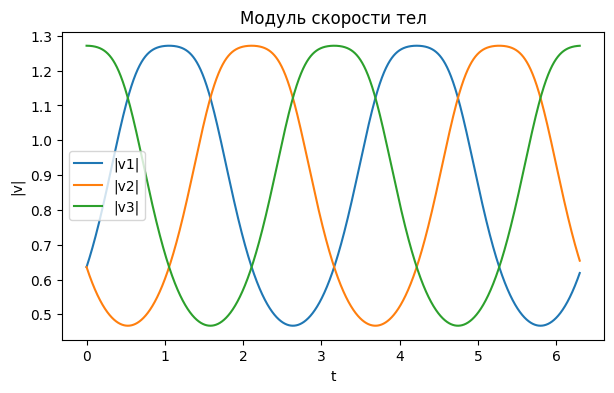

In [7]:
fig, ax = plt.subplots(figsize=(7,4))
ax.plot(T, speed[:,0], label='|v1|')
ax.plot(T, speed[:,1], label='|v2|')
ax.plot(T, speed[:,2], label='|v3|')
ax.set_xlabel('t')
ax.set_ylabel('|v|')
ax.set_title('Модуль скорости тел')
ax.legend()
plt.show()



Наборы:

1) **Фигура-восьмёрка**  
   - Конфигурация: равные массы, симметричная «восьмёрка».  
   - Смысл: все три тела движутся по одной и той же восьмёрке, сдвинутые по фазе.

2) **Два снизу, одно сверху**  
   - Конфигурация: «треугольник» (два у основания, одно наверху).  
   - Смысл: обмен импульсом, пролёты и «петли»; возможны временные квазизахваты.

3) **Равносторонний треугольник**  
   - Конфигурация: вершины равностороннего треугольника.  
   - Смысл: при согласованных скоростях треугольник может вращаться почти жёстко.

4) **Коллинеарная постановка**  
   - Конфигурация: все три тела на одной прямой.  
   - Смысл: неустойчиво; часто приводит к близким сближениям и резким разворотам.
5) **Асимметричная пара + третье тело**  
   - Два тела симметрично смещены по оси x, третье в центре.  
   - Начальные скорости почти противоположны для первых двух, третье имеет скорость вдоль оси x.  
   - Даёт хаотичные траектории с «подковообразными» петлями и обменами энергией.

Примечания:
- Во всех блоках массы равны: `m = [1, 1, 1]`.  

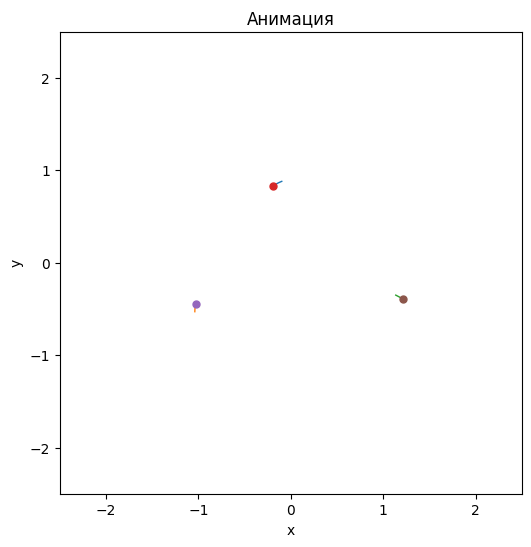

In [8]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

m = np.array([1.0, 1.0, 1.0])


# r1 = np.array([-0.97000436,  0.24308753])
# r2 = np.array([ 0.97000436, -0.24308753])
# r3 = np.array([ 0.0      ,  0.0       ])

# v1 = np.array([ 0.4662036850,  0.4323657300])
# v2 = np.array([ 0.4662036850,  0.4323657300])
# v3 = np.array([-0.93240737 , -0.86473146 ])

# r1 = np.array([-0.5, 0.0])
# r2 = np.array([ 0.5, 0.0])
# r3 = np.array([ 0.0, 2.0])

# v1 = np.array([ 0.0,  0.6])
# v2 = np.array([ 0.0, -0.6])
# v3 = np.array([ 1.0,  0.0])


r1 = np.array([ 1.0, 0.0])
r2 = np.array([-0.5, np.sqrt(3)/2])
r3 = np.array([-0.5, -np.sqrt(3)/2])

v1 = np.array([ 0.0,  0.5])
v2 = np.array([ 0.5, -0.25])
v3 = np.array([-0.5, -0.25])


# r1 = np.array([-1.0, 0.0])
# r2 = np.array([ 0.0, 0.0])
# r3 = np.array([ 1.0, 0.0])

# v1 = np.array([ 0.0,  0.3])
# v2 = np.array([ 0.0, -0.6])
# v3 = np.array([ 0.0,  0.3])


# r1 = np.array([ 1.0,  0.1])
# r2 = np.array([-1.0, -0.1])
# r3 = np.array([ 0.0,  0.0])

# v1 = np.array([ 0.0, -0.5])
# v2 = np.array([ 0.0,  0.5])
# v3 = np.array([ 0.7,  0.0])

y0 = np.hstack([r1, r2, r3, v1, v2, v3])

t0 = 0.0
t1 = 6.3
dt = 0.001

T, Y = integrate_rk4(y0, t0, t1, dt, m)
R = Y[:, :6].reshape(-1, 3, 2)
V = Y[:, 6:].reshape(-1, 3, 2)

fig, ax = plt.subplots(figsize=(6,6))
ax.set_aspect('equal', 'box')
ax.set_xlim(-2.5, 2.5)
ax.set_ylim(-2.5, 2.5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Анимация')

lines = [ax.plot([], [], '-', lw=1.0)[0] for _ in range(3)]
points = [ax.plot([], [], 'o', ms=5)[0] for _ in range(3)]
trail_len = 200

def init():
    for ln, pt in zip(lines, points):
        ln.set_data([], [])
        pt.set_data([], [])
    return lines + points

def update(frame):
    # проверяем все тела
    if np.any(np.abs(R[frame]) > 2.5):
        anim.event_source.stop()   # стоп анимации
        return lines + points

    i0 = max(0, frame - trail_len)
    for b in range(3):
        xtrail = R[i0:frame, b, 0]
        ytrail = R[i0:frame, b, 1]
        lines[b].set_data(xtrail, ytrail)
        points[b].set_data([R[frame, b, 0]], [R[frame, b, 1]])
    return lines + points

anim = FuncAnimation(fig, update, frames=range(0, len(T), 100),
                     init_func=init, interval=20, blit=True)
HTML(anim.to_jshtml())



### Блок 9: что и зачем

Определяем функции:
- `energy` — вычисление полной/кинетической/потенциальной энергии.
- Интегрируем во времени и копим траектории для трёх тел.
Строим графики:
- энергия/инварианты во времени.

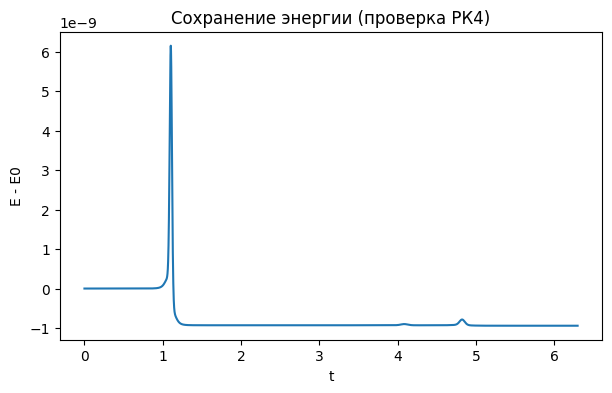

In [9]:

def energy(r, v, m):
    KE = 0.5*np.sum(m[:,None]*v*v)
    PE = 0.0
    for i in range(3):
        for j in range(i+1, 3):
            diff = r[j] - r[i]
            dist = np.sqrt(diff[0]*diff[0] + diff[1]*diff[1])
            PE -= G*m[i]*m[j]/dist
    return KE + PE

E = np.array([energy(R[k], V[k], m) for k in range(len(T))])

fig, ax = plt.subplots(figsize=(7,4))
ax.plot(T, E - E[0])
ax.set_xlabel('t')
ax.set_ylabel('E - E0')
ax.set_title('Сохранение энергии (проверка РК4)')
plt.show()



Общее:
- Массы `m`, начальные позиции `r1,r2,r3`, скорости `v1,v2,v3`.
- Центр масс и суммарный импульс приведены к нулю (корректировки координат и скоростей).
- Анимация: маркеры показывают текущие положения тел, линии — след траектории длиной `trail_len`.

1) **Звезда–планета–луна** *(сработало плохо)*  
   Идея: массивная звезда, планета на орбите радиуса `R`, луна на орбите радиуса `rho` вокруг планеты.  
   Наблюдение: вместо спутниковой динамики луна быстро «оторвалась» и вышла на собственную орбиту вокруг звезды.  
   Итог: модель не уловила область Хилла планеты, и луна повела себя как ещё одна малая планета.

2) **Две звезды + планета (циркумбинарная орбита)** *устойчиво*  
   Идея: двойная система звёзд на расстоянии `a_bin`, планета обращается вокруг центра масс на `R_p`.  
   Наблюдение: звёзды вращаются навстречу друг другу, планета описывает устойчивую орбиту вокруг пары.  
   Итог: конфигурация работает как циркумбинарная система — траектории стабильные при выбранных параметрах.

3) **Звезда + две планеты, близко к резонансу 2:1** *устойчиво*  
   Идея: массивная звезда, планеты легче; радиусы подобраны так, чтобы периоды соотносились как 2:1.  
   Наблюдение: планеты движутся с разными угловыми скоростями, но система сохраняет устойчивость, возмущения малы.  
   Итог: реализован пример орбитального резонанса; характер движения соответствует ожиданиям по закону Кеплера.

**Вывод:**  
Разные сценарии задачи трёх тел демонстрируют, насколько чувствительна система к выбору начальных условий.  
- В конфигурации «звезда–планета–луна» устойчивое спутниковое движение не удержалось.  
- В циркумбинарном варианте и при резонансе 2:1 орбиты оказались согласованными и устойчивыми.  
Это подчёркивает ключевую роль правильного подбора начальных условий и масс для возникновения устойчивых конфигураций.


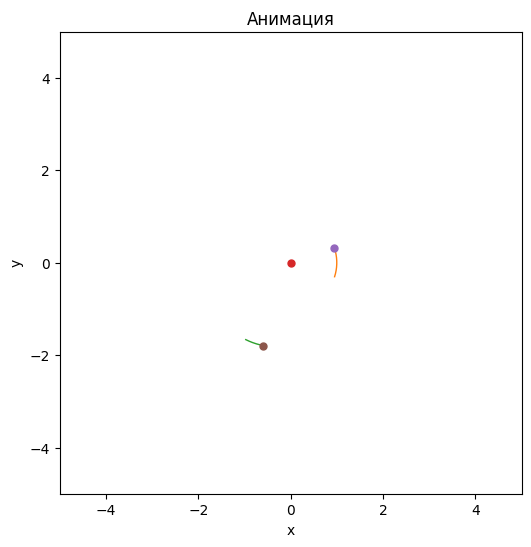

In [10]:
import numpy as np

m = np.array([1000.0, 1.0, 0.0123])  # звезда, планета, луна

R = 1.0        # радиус орбиты планеты
rho = 0.1      # радиус орбиты луны вокруг планеты

r2 = np.array([ R, 0.0])
r3 = r2 + np.array([ rho, 0.0])  # луна справа от планеты
r1 = -(m[1]*r2 + m[2]*r3)/m[0]   # чтобы центр масс=0

v_planet = np.sqrt((m[0]+m[1])/R)     # круговая скорость планеты
v_moon_rel = np.sqrt(m[1]/rho)        # скорость луны относительно планеты

v2 = np.array([0.0,  v_planet])
v3 = v2 + np.array([0.0,  v_moon_rel])
v1 = -(m[1]*v2 + m[2]*v3)/m[0]        # чтобы суммарный импульс=0

t0 = 0.0
t1 = 10
dt = 0.0001

# #Итог - получилось не то, что хотелось. Луна вращается как еще одна планета

#################################################

# m = np.array([1.0, 1.0, 0.001])  # звезда A, звезда B, планета

# a_bin = 1.0      # расстояние между звездами 1
# R_p   = 3.0      # радиус орбиты планеты вокруг центра масс

# # Положение звёзд относительно центра масс
# r1 = np.array([-a_bin/2, 0.0])
# r2 = np.array([ a_bin/2, 0.0])
# r3 = np.array([ 0.0, R_p])

# # Скорости звёзд на круговой бинарной орбите
# mu = m[0]+m[1]
# omega_bin = np.sqrt(mu/(a_bin**3))
# v1 = np.array([0.0, -omega_bin*(a_bin/2)])
# v2 = np.array([0.0,  omega_bin*(a_bin/2)])

# # Планета на круговой орбите вокруг центра масс
# v3 = np.array([ np.sqrt((mu+m[2])/R_p), 0.0])

# # Коррекция импульса центр масс=0
# Vtot = m[0]*v1 + m[1]*v2 + m[2]*v3
# v1 -= Vtot/(m[0]+m[1]+m[2])
# v2 -= Vtot/(m[0]+m[1]+m[2])
# v3 -= Vtot/(m[0]+m[1]+m[2])

# # Коррекция центра масс в ноль
# Rtot = m[0]*r1 + m[1]*r2 + m[2]*r3
# r1 -= Rtot/(m[0]+m[1]+m[2])
# r2 -= Rtot/(m[0]+m[1]+m[2])
# r3 -= Rtot/(m[0]+m[1]+m[2])

# t0 = 0.0
# t1 = 10
# dt = 0.001

# #Итог - норм. Работает корректно

##########################################

# m = np.array([1000.0, 1.0, 0.5])  # звезда, внутренняя планета, внешняя планета

# R1 = 1.0
# R2 = 2**(2/3) * R1  # чтобы T2/T1 ~ 2 по закону Кеплера

# r2 = np.array([ R1, 0.0])
# r3 = np.array([ 0.0, R2])  # смещение на 90°, чтобы снизить мгновенное возмущение
# r1 = -(m[1]*r2 + m[2]*r3)/m[0]

# v2 = np.array([0.0,  np.sqrt((m[0]+m[1])/R1)])
# v3 = np.array([ np.sqrt((m[0]+m[2])/R2), 0.0])
# v1 = -(m[1]*v2 + m[2]*v3)/m[0]

# t0 = 0.0
# t1 = 10
# dt = 0.0001

# # #Итог - норм. Работает корректно



y0 = np.hstack([r1, r2, r3, v1, v2, v3])

T, Y = integrate_rk4(y0, t0, t1, dt, m)
R = Y[:, :6].reshape(-1, 3, 2)
V = Y[:, 6:].reshape(-1, 3, 2)

fig, ax = plt.subplots(figsize=(6,6))
ax.set_aspect('equal', 'box')
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Анимация')

lines = [ax.plot([], [], '-', lw=1.0)[0] for _ in range(3)]
points = [ax.plot([], [], 'o', ms=5)[0] for _ in range(3)]
trail_len = 200

def init():
    for ln, pt in zip(lines, points):
        ln.set_data([], [])
        pt.set_data([], [])
    return lines + points

def update(frame):

    i0 = max(0, frame - trail_len)
    for b in range(3):
        xtrail = R[i0:frame, b, 0]
        ytrail = R[i0:frame, b, 1]
        lines[b].set_data(xtrail, ytrail)
        points[b].set_data([R[frame, b, 0]], [R[frame, b, 1]])
    return lines + points

anim = FuncAnimation(fig, update, frames=range(0, len(T), 100),
                     init_func=init, interval=20, blit=True)
HTML(anim.to_jshtml())